To begin copy this notebook to your own drive:

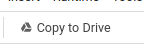


### Submission Instructions:
1. **Restart the kernel and run the notebook.** (in the menubar, select Runtime$\rightarrow$Restart runtime)
2. **Download the notebook** (in the menubar, select File$\rightarrow$Download .ipynb)
3. **Upload the downloaded notebook (.ipynb file) to your repository**.


Make sure you fill in any place that says `YOUR CODE HERE`, and that no tests/cells fail.  

Note: To use a GPU, do the following: Runtime$\rightarrow$Change runtime type$\rightarrow$ GPU

***Note: *** Ruuning this notebook and the following question may take time. Plan ahead and start early to meet the deadline!

In this exercise, you will be asked to implement a **RAG model** (Retrieval Augmented Generation) capable of answering users questions about medical information.


To accomplish this task, we will use:

1. **LangChain** for the pipeline implementation.

2. **MIRAGE** (Medical Information Retrieval-Augmented Generation Evaluation) for evaluation-datasets (see thier paper: [Benchmarking Retrieval-Augmented Generation for Medicine](https://arxiv.org/abs/2402.13178)) and medical knowledge base.

This notebook follow the Hugging face turtrials:
1. [Simple RAG for GitHub issues using Hugging Face Zephyr and LangChain](https://huggingface.co/learn/cookbook/rag_zephyr_langchain)
2. [Advanced RAG on Hugging Face documentation using LangChain](https://huggingface.co/learn/cookbook/advanced_rag)

You should read them and use their instruction, to fill in the missing parts in this notebook.


In [5]:
import os
import json
import re
from sklearn.metrics import accuracy_score
import numpy as np
import statistics
import pandas as pd
from tqdm import tqdm

## Setting:

To build our RAG model, we start by considering what is the use-case we will want our model to handle.

Here we will use **MIRAGE** baseline to evaluate RAG preformance on medical data.

To do so, please download the *benchmark.json* file from their github repository: [MIRAGE github](https://github.com/Teddy-XiongGZ/MIRAGE) to your drive directory.

In [7]:
from google.colab import drive
import os
import sys

drive.mount('/content/drive', force_remount=False)
# Fill in drive_directory the location in your drive that you upload the benchmark.json to:
drive_directory = 'drive/MyDrive/Colab Notebooks/MEDICAL_RAG'
os.chdir(drive_directory)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
benchmark = json.load(open("benchmark.json"))

To **evaluate** the RAG pipeline we will use Accuracy measure on the MMLU-med benchmark.

"**MMLU-med**"/ "**mmlu**" dataset is a multi-choise question answering on medical information.

You may read more about it on the following papers: [MEASURING MASSIVE MULTITASK
LANGUAGE UNDERSTANDING](https://arxiv.org/pdf/2009.03300) and [Benchmarking Retrieval-Augmented Generation for Medicine](https://arxiv.org/pdf/2402.13178)

So, let's start by exploring the dataset:

In [9]:
mmlu_dataset = benchmark['mmlu']
example_key = 'anatomy-000'

In [10]:
mmlu_dataset[example_key]

{'question': 'A lesion causing compression of the facial nerve at the stylomastoid foramen will cause ipsilateral',
 'options': {'A': 'paralysis of the facial muscles.',
  'B': 'paralysis of the facial muscles and loss of taste.',
  'C': 'paralysis of the facial muscles, loss of taste and lacrimation.',
  'D': 'paralysis of the facial muscles, loss of taste, lacrimation and decreased salivation.'},
 'answer': 'A'}

# Lets build a simple RAG

In [11]:
!pip install -q torch transformers transformers accelerate bitsandbytes langchain sentence-transformers faiss-cpu openpyxl pacmap datasets langchain-community ragatouille

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 647.5/647.5 kB 16.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 115.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 54.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

## Retriver

To define our RAG model, we need to decide what is our **knowlage-base**.

MIRAGE provided for us, on top of evaluation setting, corpora of medical knowledge. (I strognly recomend reading briefly their [article](https://arxiv.org/pdf/2402.13178) for better understanding.)


To simplify things in this exercise, we will use MIRAGE published datasets in HuggingFace - were they already chuncked medical textbook to documents.

Please have a look on the section *Split the documents into chunks* in the [Advanced RAG turturial](https://colab.research.google.com/github/huggingface/cookbook/blob/main/notebooks/en/advanced_rag.ipynb#scrollTo=-uS6Mv8O9-9L)  to understand how it is being done

In [12]:
import datasets

chunked_docs = datasets.load_dataset("MedRAG/textbooks", split="train")


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/2.62k [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/18 [00:00<?, ?it/s]

Immunology_Janeway.jsonl:   0%|          | 0.00/7.89M [00:00<?, ?B/s]

Pediatrics_Nelson.jsonl:   0%|          | 0.00/6.84M [00:00<?, ?B/s]

Pathoma_Husain.jsonl:   0%|          | 0.00/983k [00:00<?, ?B/s]

Anatomy_Gray.jsonl:   0%|          | 0.00/5.19M [00:00<?, ?B/s]

Neurology_Adams.jsonl:   0%|          | 0.00/19.5M [00:00<?, ?B/s]

Histology_Ross.jsonl:   0%|          | 0.00/7.05M [00:00<?, ?B/s]

First_Aid_Step2.jsonl:   0%|          | 0.00/2.50M [00:00<?, ?B/s]

Physiology_Levy.jsonl:   0%|          | 0.00/6.97M [00:00<?, ?B/s]

InternalMed_Harrison.jsonl:   0%|          | 0.00/52.6M [00:00<?, ?B/s]

Obstentrics_Williams.jsonl:   0%|          | 0.00/15.2M [00:00<?, ?B/s]

Pharmacology_Katzung.jsonl:   0%|          | 0.00/11.9M [00:00<?, ?B/s]

Pathology_Robbins.jsonl:   0%|          | 0.00/8.65M [00:00<?, ?B/s]

Gynecology_Novak.jsonl:   0%|          | 0.00/13.3M [00:00<?, ?B/s]

Cell_Biology_Alberts.jsonl:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

First_Aid_Step1.jsonl:   0%|          | 0.00/1.60M [00:00<?, ?B/s]

Biochemistry_Lippincott.jsonl:   0%|          | 0.00/3.19M [00:00<?, ?B/s]

Surgery_Schwartz.jsonl:   0%|          | 0.00/30.1M [00:00<?, ?B/s]

Psichiatry_DSM-5.jsonl:   0%|          | 0.00/6.73M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/125847 [00:00<?, ? examples/s]

To work with LangChain database we will transform our Dataset object to LangChain document:

In [13]:
# Note we follow their recomendation to use contents (title concat to the content)
from langchain_core.documents import Document
documents = []
for doc_ in chunked_docs:
  documents.append(Document(page_content=doc_['contents'], metadata={'id': doc_['id'], 'title': doc_['title']}))

Defining our **knowledge base as a vector database**.

Create the embedding & retriver.
In this section, we need to define the embedding model, and the retriver algorithm.

For the DB retriver algorithm, we will use FAISS library & search algorithm, as done in the turturials.

For the embedding, the tururial uses 'BAAI/bge-base-en-v1.5' and 'thenlper/gte-small' from `HuggingFaceEmbeddings`. There are many other embeddings models available on the Hub, and you can keep an eye on the best performing ones by checking the [Massive Text Embedding Benchmark (MTEB) Leaderboard](https://huggingface.co/spaces/mteb/leaderboard).

We will start simply by one of them.


In [15]:
from langchain.vectorstores import FAISS
from langchain.embeddings import HuggingFaceEmbeddings
from langchain_community.vectorstores.utils import DistanceStrategy

# TODO
# Q2. Load embedding model from hugging face and initialize FAISS database (name it KNOWLEDGE_VECTOR_DATABASE)
# YOUR CODE HERE
model_name = "thenlper/gte-small"
embedding_model = HuggingFaceEmbeddings(
    model_name=model_name,
    multi_process=True,
    model_kwargs={"device": "cuda"},
    encode_kwargs={"normalize_embeddings": True},  # Set `True` for cosine similarity
)

KNOWLEDGE_VECTOR_DATABASE = FAISS.from_documents(
    documents, embedding_model, distance_strategy=DistanceStrategy.COSINE
)

# END YOUR CODE HERE

retriever = KNOWLEDGE_VECTOR_DATABASE.as_retriever(
    search_type="similarity",
    search_kwargs={'k': 4}
)

## Reader

### Reader model:

We define our retreiver - now let's define our LLM reader.


There are many LLMs we can use, you can have a look at: [Open-source LLM leaderboard](https://huggingface.co/spaces/HuggingFaceH4/open_llm_leaderboard).

We will simply start by using the same model as the turturials: `HuggingFaceH4/zephyr-7b-beta`.

You are recomended to use BitsAndBytesConfig for efficient running-time.

In [16]:
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM, BitsAndBytesConfig

# TODO:
# Q3. Load HuggingFaceH4/zephyr-7b-beta model using BitsAndBytesConfig as done in the turturial (name it model) and it's tokenizer.
# YOUR CODE HERE

READER_MODEL_NAME = "HuggingFaceH4/zephyr-7b-beta"

bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_use_double_quant=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.bfloat16,
)
model = AutoModelForCausalLM.from_pretrained(READER_MODEL_NAME, quantization_config=bnb_config)
tokenizer = AutoTokenizer.from_pretrained(READER_MODEL_NAME)



# END YOUR CODE HERE
print(f"As the reader model will use: {model} with it's tokenizer: {tokenizer}")

config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

`low_cpu_mem_usage` was None, now default to True since model is quantized.


model.safetensors.index.json:   0%|          | 0.00/23.9k [00:00<?, ?B/s]

model-00001-of-00008.safetensors:   0%|          | 0.00/1.89G [00:00<?, ?B/s]

model-00002-of-00008.safetensors:   0%|          | 0.00/1.95G [00:00<?, ?B/s]

model-00003-of-00008.safetensors:   0%|          | 0.00/1.98G [00:00<?, ?B/s]

model-00004-of-00008.safetensors:   0%|          | 0.00/1.95G [00:00<?, ?B/s]

model-00005-of-00008.safetensors:   0%|          | 0.00/1.98G [00:00<?, ?B/s]

model-00006-of-00008.safetensors:   0%|          | 0.00/1.95G [00:00<?, ?B/s]

model-00007-of-00008.safetensors:   0%|          | 0.00/1.98G [00:00<?, ?B/s]

model-00008-of-00008.safetensors:   0%|          | 0.00/816M [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/8 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/111 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.43k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/42.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/168 [00:00<?, ?B/s]

As the reader model will use: MistralForCausalLM(
  (model): MistralModel(
    (embed_tokens): Embedding(32000, 4096, padding_idx=2)
    (layers): ModuleList(
      (0-31): 32 x MistralDecoderLayer(
        (self_attn): MistralSdpaAttention(
          (q_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (k_proj): Linear4bit(in_features=4096, out_features=1024, bias=False)
          (v_proj): Linear4bit(in_features=4096, out_features=1024, bias=False)
          (o_proj): Linear4bit(in_features=4096, out_features=4096, bias=False)
          (rotary_emb): MistralRotaryEmbedding()
        )
        (mlp): MistralMLP(
          (gate_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
          (up_proj): Linear4bit(in_features=4096, out_features=14336, bias=False)
          (down_proj): Linear4bit(in_features=14336, out_features=4096, bias=False)
          (act_fn): SiLU()
        )
        (input_layernorm): MistralRMSNorm((4096,), eps=1e-05)
   

### Propmt

Now we will create a prompt to feed our reader LLM.
Note, we will merge the context the retreiver will give us and the question to this prompt.

We also want to specify the system instruction to encourage our LLM reader to generate an answer best for our task. Here we will use a similar promprt used by [MedRAG](https://github.com/Teddy-XiongGZ/MedRAG/blob/main/src/template.py).
Note, the instruction include the format we expect from our answer to be.


In [18]:
from langchain.llms import HuggingFacePipeline
from langchain.prompts import PromptTemplate
from transformers import pipeline
from langchain_core.output_parsers import StrOutputParser

text_generation_pipeline = pipeline(
    model=model,
    tokenizer=tokenizer,
    task="text-generation",
    temperature=0.2,
    do_sample=True,
    repetition_penalty=1.1,
    return_full_text=True,
    max_new_tokens=400,
)

llm = HuggingFacePipeline(pipeline=text_generation_pipeline)

prompt_template = """
<|system|>
You are a helpful medical expert, and your task is to answer a multi-choice medical question using the relevant documents. Please first think step-by-step and then choose the answer from the provided options. Organize your output in a json formatted as Dict{{"step_by_step_thinking": Str(explanation), "answer_choice": Str(A/B/C/D)}}. Your responses will be used for research purposes only, so please have a definite answer.
Here are the relevant documents:

{context}

</s>
<|user|>
Here is the question:
{question}

Here are the potential choices:
{options}

Please think step-by-step and generate your output in json.
</s>
<|assistant|>

 """

prompt = PromptTemplate(
    input_variables=["context", "question", "options"],
    template=prompt_template,
)

llm_chain = prompt | llm | StrOutputParser()

Device set to use cuda:0
<ipython-input-18-d93223f43c7f>:17: LangChainDeprecationWarning: The class `HuggingFacePipeline` was deprecated in LangChain 0.0.37 and will be removed in 1.0. An updated version of the class exists in the :class:`~langchain-huggingface package and should be used instead. To use it run `pip install -U :class:`~langchain-huggingface` and import as `from :class:`~langchain_huggingface import HuggingFacePipeline``.
  llm = HuggingFacePipeline(pipeline=text_generation_pipeline)


## Putting it all together:

In [19]:
def process_answer(answer_str):
  try:
    json_string_ans = answer_str.split('assistant|>\n\n')[1].strip()
    json_object = json.loads(json_string_ans)
    return json_object['answer_choice']
  except:
    return np.nan

In [20]:

from langchain_core.runnables import RunnablePassthrough, RunnableParallel, RunnableLambda

# TODO
# Q4. Define the rag-chain using langchain RunnableLambda, so it will get the
# query question and options and the context from the retreiver.

# YOUR CODE HERE

rag_chain = RunnableLambda(
    lambda x: {
        "context": retriever.get_relevant_documents(x["question"])[0].page_content,  # Get content from the retrieved document
        "question": x["question"],
        "options": x["options"],
    }
) | llm_chain
# END YOUR CODE HERE


In [21]:
question, options = mmlu_dataset[example_key]['question'], mmlu_dataset[example_key]['options']

In [22]:
question

'A lesion causing compression of the facial nerve at the stylomastoid foramen will cause ipsilateral'

In [23]:
options

{'A': 'paralysis of the facial muscles.',
 'B': 'paralysis of the facial muscles and loss of taste.',
 'C': 'paralysis of the facial muscles, loss of taste and lacrimation.',
 'D': 'paralysis of the facial muscles, loss of taste, lacrimation and decreased salivation.'}

In [24]:
example_1 = llm_chain.invoke({"context":"", "question": question, "options": options})

In [25]:
process_answer(example_1)

'C'

In [26]:
example_2 = rag_chain.invoke({"question": question, "options": options})

<ipython-input-20-997f366ba32c>:11: LangChainDeprecationWarning: The method `BaseRetriever.get_relevant_documents` was deprecated in langchain-core 0.1.46 and will be removed in 1.0. Use :meth:`~invoke` instead.
  "context": retriever.get_relevant_documents(x["question"])[0].page_content,  # Get content from the retrieved document


In [27]:
process_answer(example_2)

'A'

## Evaluation:

Running the RAG CHAIN / LLM CHAIN take some times, so we will evaluate on a subsample ~ 100 examples from the MMLU dataset as follow:

In [ ]:
np.random.seed(42)
NUM_EXAMPLES = 100

In [ ]:
def mmlu_dataset_acc_eval(your_rag_chain, num_examples):
  # Note, we could improve the code by using langchain batch processing, but for simplicity, we currently do not use this option. You may examine it yourself.
  examples_keys = np.random.choice(list(mmlu_dataset.keys()), num_examples)
  scores = np.zeros(num_examples)
  for i, exp_id in tqdm(enumerate(examples_keys)):
    question, options, golden_truth = mmlu_dataset[example_key].values()
    ans = your_rag_chain.invoke({"question": question, "options": options})
    proc_ans = process_answer(ans)
    if proc_ans is None:
      scores[i] = np.nan
    else:
      scores[i] = 1 if proc_ans == golden_truth else 0
  acc = scores.mean()
  return acc, scores

In [ ]:
acc, scores = mmlu_dataset_acc_eval(rag_chain, num_examples = NUM_EXAMPLES)
print(f"Simple medical RAG acc: {acc}. \n Example scores: {scores}")

7it [02:51, 24.22s/it]You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset
100it [40:22, 24.23s/it]

Simple medical RAG acc: 1.0. 
 Example scores: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1.]


# Visualization

Q5. 👀 Visualize the search for the closest documents, of example_key, using PaCMAP. Similarly to: [Advanced RAG turturial]( https://colab.research.google.com/github/huggingface/cookbook/blob/main/notebooks/en/advanced_rag.ipynb#scrollTo=0zM-wfiJ9-9N). Group according to the textbooks titles.

Include the question you visualize the search for and the plot in your pdf.

In [33]:
question, options = mmlu_dataset[example_key]['question'], mmlu_dataset[example_key]['options']
question

'A lesion causing compression of the facial nerve at the stylomastoid foramen will cause ipsilateral'

In [32]:
import pacmap
import numpy as np
import plotly.express as px

question, options = mmlu_dataset[example_key]['question'], mmlu_dataset[example_key]['options']

query_vector = embedding_model.embed_query(question)
embedding_projector = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0, random_state=1)

embeddings_2d = [list(KNOWLEDGE_VECTOR_DATABASE.index.reconstruct_n(idx, 1)[0]) for idx in range(len(documents))] + [query_vector]

# Fit the data (the index of transformed data corresponds to the index of the original data)
documents_projected = embedding_projector.fit_transform(np.array(embeddings_2d), init="pca")

df = pd.DataFrame.from_dict(
    [
        {
            "x": documents_projected[i, 0],
            "y": documents_projected[i, 1],
            "title": documents[i].metadata["title"],
            "extract": documents[i].page_content[:100] + "...",
            "symbol": "circle",
            "size_col": 4,
        }
        for i in range(len(documents))
    ]
    + [
        {
            "x": documents_projected[-1, 0],
            "y": documents_projected[-1, 1],
            "title": "User query",
            "extract": query_vector,
            "size_col": 100,
            "symbol": "star",
        }
    ]
)

# Visualize the embedding
fig = px.scatter(
    df,
    x="x",
    y="y",
    color="title",
    hover_data="extract",
    size="size_col",
    symbol="symbol",
    color_discrete_map={"User query": "black"},
    width=1000,
    height=700,
)
fig.update_traces(marker=dict(opacity=1, line=dict(width=0, color="DarkSlateGrey")),
                    selector=dict(mode="markers"))
fig.update_layout(legend_title_text="<b>Chunk source</b>",
                    title="<b>2D Projection of Chunk Embeddings via PaCMAP</b>")
fig.show()

# Follow up questions:

Q6. Now we have a simple pipeline for Medical QA using RAG. As you read in the turturials, to improve our model we can tune the k hyperparameter.

* what is the maixmal reasonable K for this case? (considering the chunk-size of our document and the max seq length of the model)
* Is it always preferable to choose the largest k possible?